In [1]:
import os
import numpy as np
import cv2
import albumentations as A
from PIL import Image
from matplotlib import pyplot as plt
from albumentations import Compose, BboxParams
from imageio import imwrite

In [2]:
from src.preprocessing.augmentations import get_aug, visualize_bbox, visualize, visualize_subplot, generate_augmentations

In [3]:
#Example files:
label_file = "/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats/test/labels/liebre1_99.txt"
image_file = "/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats/test/images/liebre1_99.png"

In [4]:
bboxes = []
with open(label_file, 'r') as f:
    label = f.read()
    #image = cv2.imread(image_file, cv2.IMREAD_GRAYSCALE)
    image = np.asarray(Image.open(image_file))
    #print(image.shape)
    #print(len(image.shape))
    items = label.splitlines()
    imwidth, imheight = image.shape[0], image.shape[1]
    for i in items:
        obj = i.split()
        #print(obj)
        class_id = int(obj[0])
        x_centre = float(obj[1]) * imwidth
        y_centre = float(obj[2]) * imheight
        width = float(obj[3]) * imwidth
        height = float(obj[4]) * imheight
        bb = [None] * 4
        bb[0], bb[1], bb[2], bb[3] = x_centre-width/2, y_centre-height/2, width, height
        # x1, y1, width, height
        bboxes.append(bb)
    if items[0][0] == '0':
        annotations = {'image': image, 'bboxes': bboxes, 'category_id': [0]*len(bboxes)}
    if items[0][0] == '1':
        annotations = {'image': image, 'bboxes': bboxes, 'category_id': [1]*len(bboxes)}
    category_id_to_name = {0: 'whale', 1: 'nonwhale'}

In [5]:
annotations['category_id']

[0, 0, 0, 0, 0, 0, 0, 0, 0]

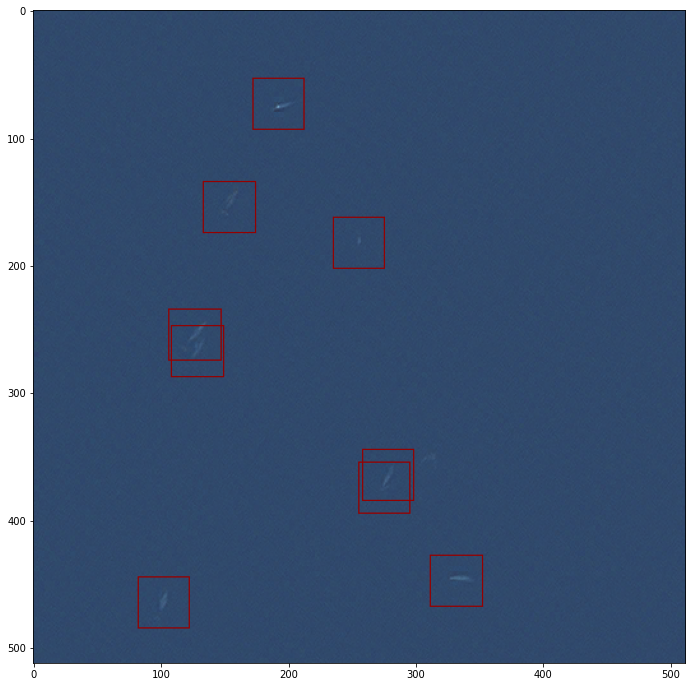

In [6]:
visualize(annotations, category_id_to_name)


/home/users/kmgreen/miniconda3/envs/whales/lib/python3.8/site-packages/albumentations/augmentations/transforms.py:1699: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/home/users/kmgreen/miniconda3/envs/whales/lib/python3.8/site-packages/albumentations/augmentations/transforms.py:1725: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(
/home/users/kmgreen/miniconda3/envs/whales/lib/python3.8/site-packages/albumentations/augmentations/transforms.py:1851: UserWarning: blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.
  warnings.warn(


1


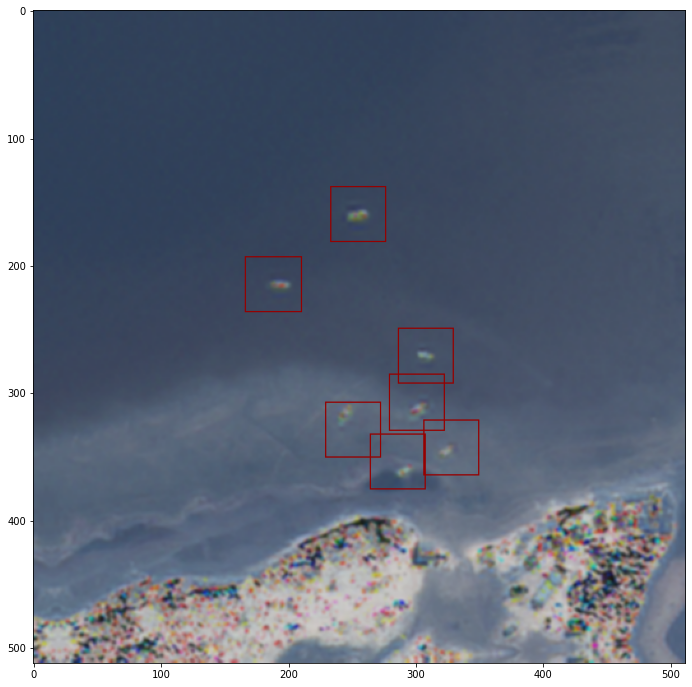

In [7]:
#Example randomly generated augmentation
aug = get_aug([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=(-180,180), always_apply=True),
    A.Blur(blur_limit=3, p=0.5),
    A.RandomBrightness(limit=0.2, p=0.5),
    A.RandomContrast(limit=0.2, p=0.5),
    A.GaussianBlur(blur_limit=3, p=0.5),
    A.GaussNoise(var_limit=(10.0, 50.0), mean=0, always_apply=False, p=0.5)


])
augmented = aug(**annotations)
visualize(augmented, category_id_to_name)
print(augmented['category_id'][0])

In [8]:
#generate_augmentations(image_file, label_file, label_file, 1)

## Generate Augmentations of image files

### Whale Class

Make data frame of files to be augmented 

In [9]:
path = '/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats_class_structure/train/class1'

folder = os.fsencode(path)

image_names = []

for file in os.listdir(folder):
    filename = os.fsdecode(file)
    if filename.endswith( ('.png') ): # whatever file types you're using...
        image_names.append(filename)

image_names.sort()

In [10]:
box_names = []

for file in os.listdir(folder):
    filename = os.fsdecode(file)
    if filename.endswith( ('.txt') ): 
        box_names.append(filename)

box_names.sort()

In [11]:
import pandas as pd
files_df = pd.DataFrame()

In [12]:
files_df['Images'] = image_names
files_df['Boxes'] = box_names

In [13]:
files_df[23:]

,Images,Boxes
23,liebre1_127.png,liebre1_127.txt
24,liebre1_13.png,liebre1_13.txt
25,liebre1_131.png,liebre1_131.txt
26,liebre1_132.png,liebre1_132.txt
27,liebre1_133.png,liebre1_133.txt
...,...,...
197,sanig_61.png,sanig_61.txt
198,sanig_62.png,sanig_62.txt
199,sanig_7.png,sanig_7.txt
200,sanig_8.png,sanig_8.txt


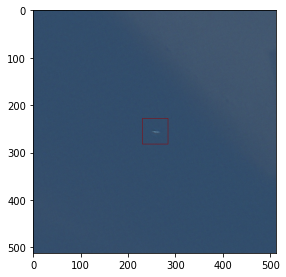

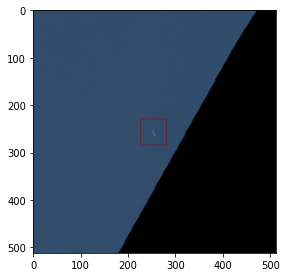

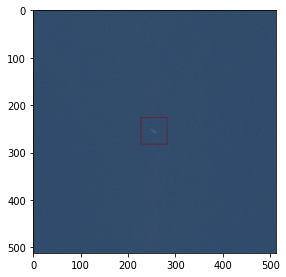

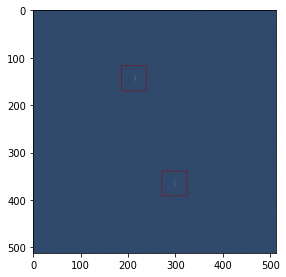

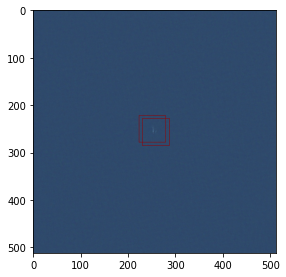

...

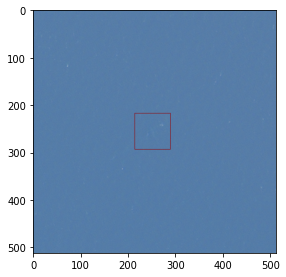

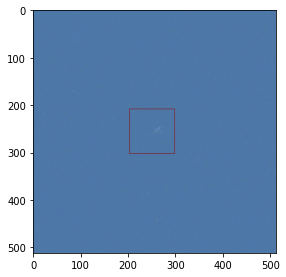

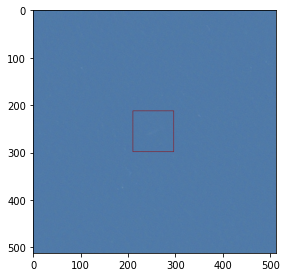

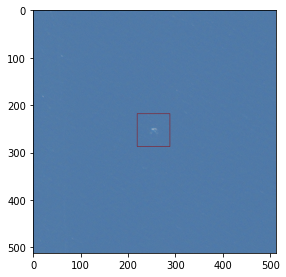

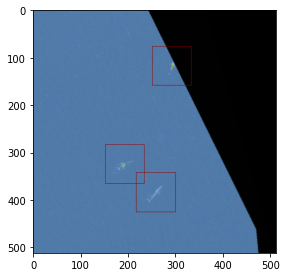

In [15]:
outputdir = '/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats_augmented2/train/images'
all_image_path = '/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats_class_structure/train/class1'

for item in range(0,202):
    image_path = os.path.join(all_image_path,files_df['Images'][item])
    box_path = os.path.join(all_image_path,files_df['Boxes'][item])
    generate_augmentations(image_path, box_path, outputdir, files_df['Boxes'][item][:-4], 1)

### Boats class

In [16]:
pathb = '/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats_class_structure/train/class2'

folderb = os.fsencode(pathb)

image_namesb = []

for file in os.listdir(folderb):
    filename = os.fsdecode(file)
    if filename.endswith( ('.png') ): # whatever file types you're using...
        image_namesb.append(filename)

image_namesb.sort()

In [17]:
box_namesb = []

for file in os.listdir(folderb):
    filename = os.fsdecode(file)
    if filename.endswith( ('.txt') ): 
        box_namesb.append(filename)

box_namesb.sort()

In [18]:
import pandas as pd
filesb_df = pd.DataFrame()

In [19]:
filesb_df['Images'] = image_namesb
filesb_df['Boxes'] = box_namesb

In [20]:
filesb_df

,Images,Boxes
0,liebre1neg_117.png,liebre1neg_117.txt
1,liebre1neg_98.png,liebre1neg_98.txt
2,liebre2neg_0.png,liebre2neg_0.txt
3,liebre2neg_1.png,liebre2neg_1.txt
4,liebre2neg_109.png,liebre2neg_109.txt
5,liebre2neg_11.png,liebre2neg_11.txt
6,liebre2neg_110.png,liebre2neg_110.txt
7,liebre2neg_112.png,liebre2neg_112.txt
8,liebre2neg_13.png,liebre2neg_13.txt
9,liebre2neg_5.png,liebre2neg_5.txt


In [3]:
outputdir = '/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats_augmented2/train/images'
all_image_path = '/gws/nopw/j04/ai4er/users/kmgreen/data/yolo_boats_class_structure/train/class2'

for item in range(1,37):
    image_path = os.path.join(all_image_path,filesb_df['Images'][item])
    box_path = os.path.join(all_image_path,filesb_df['Boxes'][item])
    #generate_augmentations(image_path, box_path, outputdir, filesb_df['Boxes'][item][:-4], 8)

NameError: name 'filesb_df' is not defined